# Librerías

In [78]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Cargar Dataset

In [79]:
df = pd.read_csv("train.csv")

In [80]:
df.head(5)

,id,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,0,1,1,1,9238,1,1,126.0,1,1,...,0,6,7,6,12.428571,0,11.1,0.6,2.02,Graduate
1,1,1,17,1,9238,1,1,125.0,1,19,...,0,6,9,0,0.000000,0,11.1,0.6,2.02,Dropout
2,2,1,17,2,9254,1,1,137.0,1,3,...,0,6,0,0,0.000000,0,16.2,0.3,-0.92,Dropout
3,3,1,1,3,9500,1,1,131.0,1,19,...,0,8,11,7,12.820000,0,11.1,0.6,2.02,Enrolled
4,4,1,1,2,9500,1,1,132.0,1,19,...,0,7,12,6,12.933333,0,7.6,2.6,0.32,Graduate


In [81]:
df.shape

(76518, 38)

In [82]:
df.isnull().sum()

id                                                0
Marital status                                    0
Application mode                                  0
Application order                                 0
Course                                            0
Daytime/evening attendance                        0
Previous qualification                            0
Previous qualification (grade)                    0
Nacionality                                       0
Mother's qualification                            0
Father's qualification                            0
Mother's occupation                               0
Father's occupation                               0
Admission grade                                   0
Displaced                                         0
Educational special needs                         0
Debtor                                            0
Tuition fees up to date                           0
Gender                                            0
Scholarship 

In [83]:
(df.describe() < 0).sum()

id                                                0
Marital status                                    0
Application mode                                  0
Application order                                 0
Course                                            0
Daytime/evening attendance                        0
Previous qualification                            0
Previous qualification (grade)                    0
Nacionality                                       0
Mother's qualification                            0
Father's qualification                            0
Mother's occupation                               0
Father's occupation                               0
Admission grade                                   0
Displaced                                         0
Educational special needs                         0
Debtor                                            0
Tuition fees up to date                           0
Gender                                            0
Scholarship 

# Representación de Variables (No ejecutar)

In [133]:
df.shape

(76518, 38)

In [134]:
fig, ax = plt.subplots(9,5,figsize=(100,100))
ax = ax.flatten()

for i in range(0,len(df.columns)):
    sns.histplot(df.iloc[:,i], ax=ax[i])

plt.show()

## Distribuciones con respecto al target

In [135]:
fig, ax = plt.subplots(9,4,figsize=(100,100))
k = 1
for i in range(0, 9):
    if df.iloc[:, k].name == "Target":
        break   
    for j in range(0, 4):
        prov_df = (df.groupby([df.iloc[:, k], "Target"]).size() / df.groupby(df.iloc[:, k]).size()).reset_index()
        prov_df.rename(columns={0: 'Proportion'}, inplace=True)
        pivot_prov = prov_df.pivot(index=df.iloc[:, k].name, columns='Target', values='Proportion')
        pivot_prov.plot(ax=ax[i, j], kind='bar', stacked=True)
        # pivot_prov.plot(ax=ax[i, j], kind='bar', stacked=True, figsize=(12, 8))
        ax[i, j].set_xlabel(df.iloc[:, k].name)
        ax[i, j].set_ylabel('Proporción')
        ax[i, j].legend(title='Target')
        ax[i, j].set_xticklabels(ax[i, j].get_xticklabels(), rotation=45)
        # plt.tight_layout()
        k+=1

plt.show()

In [258]:
fig, ax = plt.subplots(9,4,figsize=(100,100))
k = 1
for i in range(0, 9):
    if df.iloc[:, k].name == "Target":
        break   
    for j in range(0, 4):
        prov_df = (df.groupby([df.iloc[:, k], "Target"]).size()).reset_index()
        prov_df.rename(columns={0: 'Proportion'}, inplace=True)
        pivot_prov = prov_df.pivot(index=df.iloc[:, k].name, columns='Target', values='Proportion')
        pivot_prov.plot(ax=ax[i, j], kind='bar', stacked=True)
        # pivot_prov.plot(ax=ax[i, j], kind='bar', stacked=True, figsize=(12, 8))
        ax[i, j].set_xlabel(df.iloc[:, k].name)
        ax[i, j].set_ylabel('Proporción')
        ax[i, j].legend(title='Target')
        ax[i, j].set_xticklabels(ax[i, j].get_xticklabels(), rotation=45)
        # plt.tight_layout()
        k+=1

plt.show()

d:\DataScience\1. Python\3. Visualización Datos\.conda\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


In [7]:
import matplotlib.pyplot as plt
import pandas as pd

# Suponiendo que df es tu DataFrame
fig, ax = plt.subplots(9, 4, figsize=(100, 100))
k = 1

for i in range(0, 9):
    if df.iloc[:, k].name == "Target":
        break   
    for j in range(0, 4):
        prov_df = (df.groupby([df.iloc[:, k], "Target"]).size()).reset_index(name='Count')
        pivot_prov = prov_df.pivot(index=df.iloc[:, k].name, columns='Target', values='Count')

        ax_current = ax[i, j]
        pivot_prov.plot(ax=ax_current, kind='bar', stacked=True)

        ax_current.set_xlabel(df.iloc[:, k].name)
        ax_current.set_ylabel('Conteo')
        ax_current.legend(title='Target')
        ax_current.set_xticklabels(ax_current.get_xticklabels(), rotation=45)

        # Añadir porcentajes en las barras
        for c in ax_current.containers:
            labels = [f'{v.get_height() / pivot_prov.sum(axis=1).values[i]:.1%}' for i, v in enumerate(c)]
            ax_current.bar_label(c, labels=labels, label_type='center')

        k += 1

plt.tight_layout()
plt.show()


C:\Users\Sergio\AppData\Local\Temp\ipykernel_10812\3248096444.py:30: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
d:\DataScience\1. Python\3. Visualización Datos\.conda\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


In [7]:
df.groupby("Target").size()/df.shape[0]*100


Target
Dropout     33.058888
Enrolled    19.524818
Graduate    47.416294
dtype: float64

# Procesamiento datos

In [117]:
def procesamiento(data):
    data2 = data.copy()
    data2.drop(columns="id", inplace=True)
    data2["Curricular units enrolled"] = data2['Curricular units 1st sem (enrolled)'] + data2['Curricular units 2nd sem (enrolled)']
    data2["Curricular units approved"] = data2['Curricular units 1st sem (approved)'] + data2['Curricular units 2nd sem (approved)']
    data2["Curricular units credited"] = data2['Curricular units 1st sem (credited)'] + data2['Curricular units 2nd sem (credited)']
    data2["Curricular units evaluations"] = data2['Curricular units 1st sem (evaluations)'] + data2['Curricular units 2nd sem (evaluations)']
    data2["Curricular units without evaluations"] = data2['Curricular units 1st sem (without evaluations)'] + data2['Curricular units 2nd sem (without evaluations)']  
    variables_categoricas = ['Marital status', 'Application mode', 'Application order', 
                            'Course', 'Daytime/evening attendance', 'Previous qualification',
                            'Nacionality',
                            "Mother's qualification", "Father's qualification",
                            "Mother's occupation", "Father's occupation",
                            'Displaced', 'Educational special needs', 'Debtor',
                            'Tuition fees up to date', 'Gender', 'Scholarship holder',
                            'International']
    variables_categoricas_muchas_divisiones = ['Age at enrollment']
    variables_numericas = ['Previous qualification (grade)', 'Admission grade','Curricular units 1st sem (grade)', 
                            'Curricular units 2nd sem (grade)', 'Inflation rate', 'GDP', 'Unemployment rate', 
                            'Curricular units 1st sem (credited)',
                            'Curricular units 1st sem (enrolled)',
                            'Curricular units 1st sem (evaluations)',
                            'Curricular units 1st sem (approved)',
                            'Curricular units 1st sem (without evaluations)',
                            'Curricular units 2nd sem (credited)',
                            'Curricular units 2nd sem (enrolled)',
                            'Curricular units 2nd sem (evaluations)',
                            'Curricular units 2nd sem (approved)',                        
                            'Curricular units 2nd sem (without evaluations)', "Curricular units enrolled", 
                        "Curricular units approved", "Curricular units credited", "Curricular units evaluations",
                        "Curricular units without evaluations", 'Age at enrollment']

    courses_lejos_media = [33, 171, 9119, 9500]
    data2["Course"] = data2["Course"].apply(lambda x: x if x in courses_lejos_media else "Others")
    
    data2[variables_categoricas] = data2[variables_categoricas].astype(str)
    data2[variables_categoricas_muchas_divisiones] = data2[variables_categoricas_muchas_divisiones].astype(str)
    data2[variables_numericas] = data2[variables_numericas].astype(float)
    # droped_columns = ['Marital status', 'Application mode', 'Application order', 
    #                     'Course', 'Daytime/evening attendance', 'Previous qualification',
    #                     'Nacionality',
    #                     "Mother's qualification", "Father's qualification",
    #                     "Mother's occupation", "Father's occupation",
    #                     'Displaced', 'Educational special needs', 'Debtor',
    #                     'Tuition fees up to date', 'Gender', 'Scholarship holder',
    #                     'International', 'Age at enrollment']

    droped_columns = ['Marital status', 'Application mode', 'Application order', 
                        'Previous qualification',
                        'Nacionality',
                        "Mother's qualification", "Father's qualification",
                        "Mother's occupation", "Father's occupation",
                        'Displaced', 'Educational special needs',                        
                        'International']
    data2.drop(columns=droped_columns, inplace=True)
    data2 = pd.get_dummies(data2, drop_first=True, dtype=float)
    return data2


In [118]:
X=df.drop(columns="Target")
y=df["Target"]
print(X.shape)
print(y.shape)

(76518, 37)
(76518,)


In [119]:
X= procesamiento(X)
X.shape
print(X.shape)
X.head()

(76518, 32)


,Previous qualification (grade),Admission grade,Age at enrollment,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),...,Curricular units without evaluations,Course_33,Course_9119,Course_9500,Course_Others,Daytime/evening attendance_1,Debtor_1,Tuition fees up to date_1,Gender_1,Scholarship holder_1
0,126.0,122.6,18.0,0.0,6.0,6.0,6.0,14.500000,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
1,125.0,119.8,18.0,0.0,6.0,8.0,4.0,11.600000,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0
2,137.0,144.7,18.0,0.0,6.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
3,131.0,126.1,18.0,0.0,7.0,9.0,7.0,12.591250,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
4,132.0,120.1,18.0,0.0,7.0,12.0,6.0,12.933333,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0


## Categorizo en numéricas y categóricas

In [120]:
df2 = procesamiento(df)

In [121]:
correlation_matrix = df2.corr()


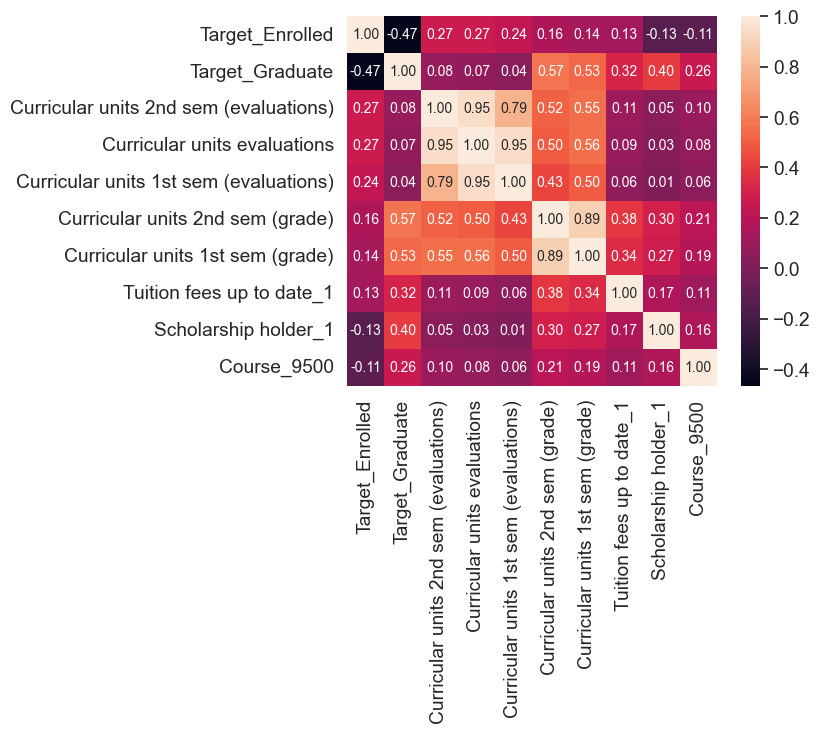

In [122]:
#Ampliación matriz, para variable que se selecciona muestra las k variables más correlacionadas, Substituye 'NOMBREVARIABLE' por el nombre de la variable a estudiar
k = 10 #numero de variables
## Target_Enrolled
cols = abs(correlation_matrix["Target_Enrolled"]).sort_values(ascending=False).nlargest(k).index
#nlargest --> coge los valores más altos
cm = np.corrcoef(df2[cols].values.T) 
sns.set(font_scale=1.25)
#y mapa de calor
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

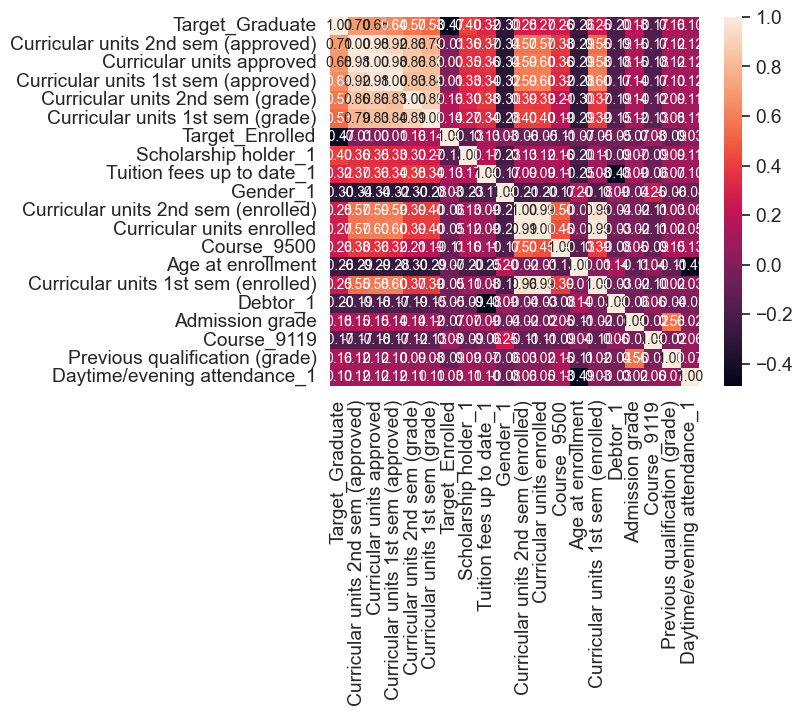

In [123]:
#Ampliación matriz, para variable que se selecciona muestra las k variables más correlacionadas, Substituye 'NOMBREVARIABLE' por el nombre de la variable a estudiar
k = 20 #numero de variables
## Target_Graduate
cols = abs(correlation_matrix["Target_Graduate"]).sort_values(ascending=False).nlargest(k).index
#nlargest --> coge los valores más altos
cm = np.corrcoef(df2[cols].values.T) 
sns.set(font_scale=1.25)
#y mapa de calor
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

## Estudio de categóricas

### Course

In [124]:
course = pd.DataFrame(df.groupby(["Course","Target"]).size()/df.groupby("Course").size())
course = course.reset_index()
course

,Course,Target,0
0,33,Dropout,0.750000
1,33,Enrolled,0.138889
2,33,Graduate,0.111111
3,39,Dropout,1.000000
4,171,Dropout,0.712487
5,171,Enrolled,0.072753
6,171,Graduate,0.214760
7,979,Dropout,1.000000
8,8014,Dropout,0.417145
9,8014,Enrolled,0.105414


In [125]:
course.rename(columns={0:"Porcentaje"}, inplace=True)

In [126]:
course

,Course,Target,Porcentaje
0,33,Dropout,0.750000
1,33,Enrolled,0.138889
2,33,Graduate,0.111111
3,39,Dropout,1.000000
4,171,Dropout,0.712487
5,171,Enrolled,0.072753
6,171,Graduate,0.214760
7,979,Dropout,1.000000
8,8014,Dropout,0.417145
9,8014,Enrolled,0.105414


In [127]:
conditions = {
    'Dropout': 0.33,
    'Enrolled': 0.19,
    'Graduate': 0.47
}
tolerance = 0.3

# Lista para almacenar los cursos que se alejan de las condiciones
courses_out_of_range = []

for course_id in course['Course'].unique():
    course_data = course[course['Course'] == course_id]
    for target in course_data['Target'].unique():
        value = course_data[course_data['Target'] == target]['Porcentaje'].values[0]
        if abs(value - conditions[target]) > tolerance:
            courses_out_of_range.append(course_id)
            break

print("Courses out of range:", courses_out_of_range)

Courses out of range: [33, 39, 171, 979, 9119, 9500]


In [128]:
# 39, 979 no están en el df_submission hago esta lista para simplificar course [33, 171, 9119, 9500]

In [129]:
len(course["Course"].unique())

19

In [130]:
len(courses_out_of_range)

6

# Modelos

## KNN

In [192]:
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn import preprocessing
from sklearn.model_selection import GridSearchCV
from matplotlib import pyplot as plt
from sklearn.metrics import make_scorer
from sklearn.metrics import accuracy_score, roc_auc_score
import pandas as pd
import numpy as np
from sklearn import tree
import seaborn as sns
from sklearn.preprocessing import scale
import sklearn
from sklearn.neighbors import KNeighborsClassifier

In [27]:
model=KNeighborsClassifier()
model.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [28]:
X = df.drop(columns=['Target'])
X = procesamiento(X)
y = df["Target"].copy()
# y.replace({"Dropout":0,"Enrolled":1,"Graduate":2}, inplace=True)


In [70]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (53562, 32) (53562,)
Test set: (22956, 32) (22956,)


In [30]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 53562 entries, 59380 to 21120
Data columns (total 32 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Previous qualification (grade)                  53562 non-null  float64
 1   Admission grade                                 53562 non-null  float64
 2   Age at enrollment                               53562 non-null  float64
 3   Curricular units 1st sem (credited)             53562 non-null  float64
 4   Curricular units 1st sem (enrolled)             53562 non-null  float64
 5   Curricular units 1st sem (evaluations)          53562 non-null  float64
 6   Curricular units 1st sem (approved)             53562 non-null  float64
 7   Curricular units 1st sem (grade)                53562 non-null  float64
 8   Curricular units 1st sem (without evaluations)  53562 non-null  float64
 9   Curricular units 2nd sem (credited)     

In [31]:
from sklearn.preprocessing import StandardScaler
objeto_escalador = StandardScaler()
objeto_escalador.fit(X_train) #solo escalamos el train, no el test
#objeto_escalador.transform(X_train)
X_train[:] = objeto_escalador.transform(X_train)
X_test[:] = objeto_escalador.transform(X_test)
# otra forma de hacerlo sería:
# scaled=objeto_escalador.transform(X_train)
# scaled_data = pd.DataFrame(scaled, columns=X_train.columns)

In [32]:
params = {'n_neighbors': [2,5,10,20,25]} # p es Power parameter for the Minkowski metric
# scoring = ["accuracy", "roc_auc"]
scoring = ["accuracy"]

n_cv = 5 #número de veces que hace split para cross validation
grid_solver = GridSearchCV(estimator=model, 
                           param_grid = params, 
                           scoring = scoring, 
                           cv=n_cv, 
                           refit="accuracy", 
                           verbose=2)

model_result = grid_solver.fit(X_train, y_train)

print("Mejor score:", model_result.best_score_)
print("Mejores parámetros:", model_result.best_params_)

print("Train score:", model_result.score(X_train, y_train))
print("Test score:", model_result.score(X_test, y_test))

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] END ......................................n_neighbors=2; total time=   1.9s
[CV] END ......................................n_neighbors=2; total time=   1.6s
[CV] END ......................................n_neighbors=2; total time=   1.4s
[CV] END ......................................n_neighbors=2; total time=   1.6s
[CV] END ......................................n_neighbors=2; total time=   1.6s
[CV] END ......................................n_neighbors=5; total time=   1.6s
[CV] END ......................................n_neighbors=5; total time=   1.5s
[CV] END ......................................n_neighbors=5; total time=   1.6s
[CV] END ......................................n_neighbors=5; total time=   1.5s
[CV] END ......................................n_neighbors=5; total time=   1.5s
[CV] END .....................................n_neighbors=10; total time=   1.5s
[CV] END .....................................n_n

In [33]:
### En este dataset no podemos calcular la AUC, calculamos solo Accuracy
# prediccion de la y en el train

y_pred = model_result.predict(X_train)
#probs = model_result.predict_proba(X_train)
#print("Train AUC:", sklearn.metrics.roc_auc_score(y_train, probs[:,1]))
print("Train Accuracy:", sklearn.metrics.accuracy_score(y_train, y_pred))


# prediccion de la y en el test
y_pred = model_result.predict(X_test)
#probs = model_result.predict_proba(X_test)
#print("Train AUC:", sklearn.metrics.roc_auc_score(y_test, probs[:,1]))
print("Train Accuracy:", sklearn.metrics.accuracy_score(y_test, y_pred))

Train Accuracy: 0.8165863858705799
Train Accuracy: 0.8044084335250044


In [35]:
y_pred

array(['Graduate', 'Dropout', 'Graduate', ..., 'Dropout', 'Graduate',
       'Graduate'], dtype=object)

In [36]:
best_model = model_result.best_estimator_
best_model
X_escalada = X.copy()
X_escalada[:] = objeto_escalador.transform(X_escalada)
final_model = best_model.fit(X_escalada,y) #hacemos el fit de los datos con el mejor modelo

In [37]:
results = model_result.cv_results_
results = pd.DataFrame(results)
results.head(5).T

,0,1,2,3,4
mean_fit_time,0.08059,0.07106,0.074081,0.072371,0.073651
std_fit_time,0.012805,0.001804,0.004456,0.00241,0.003715
mean_score_time,1.623091,1.548816,1.552101,1.56062,1.548263
std_score_time,0.161117,0.038173,0.029774,0.078477,0.078794
param_n_neighbors,2,5,10,20,25
params,{'n_neighbors': 2},{'n_neighbors': 5},{'n_neighbors': 10},{'n_neighbors': 20},{'n_neighbors': 25}
split0_test_accuracy,0.716699,0.789975,0.798936,0.803323,0.802576
split1_test_accuracy,0.725287,0.789321,0.797069,0.800149,0.801269
split2_test_accuracy,0.726942,0.792102,0.805358,0.809186,0.807226
split3_test_accuracy,0.720314,0.793876,0.803118,0.801531,0.803865


### Predecir Test

In [38]:
df_submission = pd.read_csv("test.csv")

In [39]:
X_submission = procesamiento(df_submission)

In [40]:
X_submission.shape

(51012, 32)

In [41]:
X_submission[:] = objeto_escalador.transform(X_submission)

In [42]:
y_submission = final_model.predict(X_submission)

In [43]:
y_submission

array(['Dropout', 'Graduate', 'Graduate', ..., 'Dropout', 'Dropout',
       'Dropout'], dtype=object)

In [44]:
submission=pd.read_csv("sample_submission.csv")

In [45]:
submission.Target=y_submission
submission.to_csv("submission.csv", index=False)

## Logistic Regression

In [131]:
from sklearn.linear_model import LogisticRegression

In [132]:
X = df.drop(columns=['Target'])
X = procesamiento(X)
y = df["Target"].copy()
# y.replace({"Dropout":0,"Enrolled":1,"Graduate":2}, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify=y)

In [133]:
clf = LogisticRegression()
clf = LogisticRegression(solver='liblinear') # el solver el tipo de gradientes, tendremos diferentes
clf.fit(X_train, y_train)

LogisticRegression(solver='liblinear')

In [134]:
clf.coef_

array([[ 1.67082779e-03, -3.71261063e-03,  3.61332167e-02,
        -2.33970024e-02,  2.23781943e-03, -1.39541728e-02,
         2.76012734e-02,  2.60069897e-03,  2.93109287e-02,
         9.73909827e-02,  1.85737611e-01, -6.81965722e-03,
        -3.02019325e-01, -9.78372449e-02, -3.93593939e-03,
         4.34321844e-02,  1.23298229e-02, -1.68502436e-02,
         1.87975431e-01, -2.74418051e-01,  7.39939803e-02,
        -2.07738300e-02,  2.53749893e-02,  3.94106058e-02,
        -1.07409447e+00, -9.08351168e-01, -7.71602463e-01,
        -2.60152974e-02,  7.43726751e-01, -2.41142956e+00,
         3.48397868e-01, -6.87661234e-01],
       [-1.49149929e-02, -6.84449324e-03, -3.77701537e-02,
         1.53863404e-02, -2.49065940e-02,  2.88007369e-02,
         5.28800538e-02,  9.31828345e-04, -9.49870915e-02,
         3.09766567e-02, -1.50422696e-01,  7.98251646e-02,
        -1.25896905e-01,  1.73610306e-01,  2.87937705e-02,
        -4.05594232e-02,  7.59671537e-03, -2.64322573e-02,
        -1.75

In [135]:
y_pred = clf.predict(X_test) # # la y_predicha viene de las probabilidades y escogiendo directamente el threshold como 0.5
y_pred

array(['Graduate', 'Dropout', 'Graduate', ..., 'Graduate', 'Dropout',
       'Graduate'], dtype=object)

In [136]:
probs = clf.predict_proba(X_test) # si quieremos establecer threshold, nos da las probabilidades en forma de array
probs # [probabilidad de 0, probabilidad de 1]
(probs[:,1]>0.5) # establecemos el threshold para que sea 1
(probs[:,1]>0.5)*1 # con esto lo convertimos a tipo int

array([0, 0, 0, ..., 0, 0, 0])

In [137]:
#es mejor calcular accuracy_score, ya que le pasamos y_test con Y_pred

# Train
y_pred=clf.predict(X_train)
print("Train Accuracy:", accuracy_score(y_train, y_pred))
# Test
y_pred = clf.predict(X_test)
print("Test Accuracy:", accuracy_score(y_test, y_pred))

Train Accuracy: 0.8095867336566666
Test Accuracy: 0.8142969158389963


### Confusion Matrix

In [138]:
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

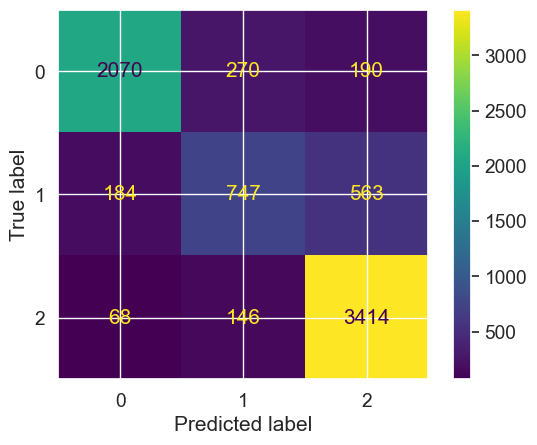

In [139]:
cfm = confusion_matrix(y_test, y_pred) # ()
disp = ConfusionMatrixDisplay(cfm)
disp.plot()
plt.show()

# ### Normalizada
# cfm = confusion_matrix(y_train, y_pred, normalize="all") # tambien podemos normalizar la matriz
# disp = ConfusionMatrixDisplay(cfm)
# disp.plot()
# plt.show()

In [140]:
from sklearn.metrics import classification_report

In [141]:
print(f"Model Classification Report : \n{classification_report(y_test, y_pred)}")

Model Classification Report : 
              precision    recall  f1-score   support

     Dropout       0.89      0.82      0.85      2530
    Enrolled       0.64      0.50      0.56      1494
    Graduate       0.82      0.94      0.88      3628

    accuracy                           0.81      7652
   macro avg       0.78      0.75      0.76      7652
weighted avg       0.81      0.81      0.81      7652



In [142]:
y_test.head(5)

26124     Dropout
49937     Dropout
30808    Graduate
44819    Graduate
62516     Dropout
Name: Target, dtype: object

### Grid Search

In [143]:
clf = LogisticRegression()
clf.get_params()


{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'deprecated',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [144]:
params = {'solver':['liblinear']}
scoring = ['accuracy']
grid_solver = GridSearchCV(estimator = clf, # model to train
                   param_grid = params,
                   scoring = scoring,
                   cv = 5,
                   n_jobs=-1,
                   refit='accuracy',
                   verbose = 2)

model_result_LogReg = grid_solver.fit(X_train,y_train) # generamos las combinaciones

Fitting 5 folds for each of 1 candidates, totalling 5 fits


In [145]:
model_result_LogReg.best_estimator_

LogisticRegression(solver='liblinear')

In [146]:
print("Train")
y_hat=model_result_LogReg.predict(X_train)
print("Accuracy:", accuracy_score(y_train,y_hat))
# y_pred=model_result_LogReg.predict(X_train)
# probs=model_result_LogReg.predict_proba(X_train)
# print("Train AUC:", roc_auc_score(y_train,probs[:,1]))

print("Test")
y_hat=model_result_LogReg.predict(X_test)
print("Accuracy:", accuracy_score(y_test,y_hat))
# y_pred=model_result_LogReg.predict(X_test)
# probs=model_result_LogReg.predict_proba(X_test)
# print("Train AUC:", roc_auc_score(y_test,probs[:,1]))


Train
Accuracy: 0.8095867336566666
Test
Accuracy: 0.8142969158389963


In [115]:
best_model = model_result_LogReg.best_estimator_
best_model
final_model = best_model.fit(X,y) #hacemos el fit de los datos con el mejor modelo

In [116]:
y_test = final_model.predict(X_test)

## Decision Tree CART

In [147]:
from sklearn.tree import DecisionTreeClassifier # predict roba

In [148]:
X = df.drop(columns=['Target'])
X = procesamiento(X)
y = df["Target"].copy()
# y.replace({"Dropout":0,"Enrolled":1,"Graduate":2}, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify=y)

In [149]:
# especificando el modelo
model = DecisionTreeClassifier()
model.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'random_state': None,
 'splitter': 'best'}

In [150]:
params={'min_samples_leaf': 10}
model.set_params(**params)

DecisionTreeClassifier(min_samples_leaf=10)

In [151]:
tree_model=model.fit(X_train,y_train)

In [152]:
##### no usar score
print("Train score", tree_model.score(X_train,y_train))
print("Test score", tree_model.score(X_test, y_test))
# train
y_pred=tree_model.predict(X_train)
probs=tree_model.predict_proba(X_train)
# print("Train AUC", sklearn.metrics.roc_auc_score(y_train, probs[:,1]))
print("Train Accuracy", sklearn.metrics.accuracy_score(y_train,y_pred))
# test
y_pred=tree_model.predict(X_test)
probs=tree_model.predict_proba(X_test)
# print("Test AUC", sklearn.metrics.roc_auc_score(y_test, probs[:,1]))
print("Test Accuracy",  sklearn.metrics.accuracy_score(y_test,y_pred))

Train score 0.8593500421107658
Test score 0.7869837950862519
Train Accuracy 0.8593500421107658
Test Accuracy 0.7869837950862519


### Grid Search

In [153]:
model = DecisionTreeClassifier()
params = {'ccp_alpha': [0.0, 0.1], 
          'class_weight': [None], 
          'criterion': ['gini'], 
          'max_depth': [4, 6], 
          'max_features': [None], 
          'max_leaf_nodes': [None], 
          'min_impurity_decrease': [0.0, 0.1], 
          'min_samples_leaf': [10, 15], 
          'min_samples_split': [25 , 40], 
          'min_weight_fraction_leaf': [0.0], 
          'monotonic_cst': [None], 
          'random_state': [None], 
          'splitter': ['best']}

scoring = ['accuracy']

In [154]:
n_cv=5 # 5 folds
# creamos la GridSeacrh # cross-validation
grid_solver = GridSearchCV(estimator = model, # model to train
                   param_grid = params, # param_grid
                   scoring = scoring,
                   cv = n_cv,
                   refit = 'accuracy',
                   verbose = 2)

## el refit es la que elige el mejor modelo


model_result_trees = grid_solver.fit(X_train,y_train)

print("Mejor score:", model_result.best_score_)
# tenemos los mejores parametros
print("Mejores parametros:",model_result.best_params_)

Fitting 5 folds for each of 32 candidates, totalling 160 fits
[CV] END ccp_alpha=0.0, class_weight=None, criterion=gini, max_depth=4, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=25, min_weight_fraction_leaf=0.0, monotonic_cst=None, random_state=None, splitter=best; total time=   0.1s
[CV] END ccp_alpha=0.0, class_weight=None, criterion=gini, max_depth=4, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=25, min_weight_fraction_leaf=0.0, monotonic_cst=None, random_state=None, splitter=best; total time=   0.1s
[CV] END ccp_alpha=0.0, class_weight=None, criterion=gini, max_depth=4, max_features=None, max_leaf_nodes=None, min_impurity_decrease=0.0, min_samples_leaf=10, min_samples_split=25, min_weight_fraction_leaf=0.0, monotonic_cst=None, random_state=None, splitter=best; total time=   0.1s
[CV] END ccp_alpha=0.0, class_weight=None, criterion=gini, max_depth=4, max_feature

In [155]:
# Train
y_pred=model_result_trees.predict(X_train)
probs=model_result_trees.predict_proba(X_train)
# print("Train AUC:", sklearn.metrics.roc_auc_score(y_train,probs[:,1]))
print("Train Accuracy:", sklearn.metrics.accuracy_score(y_train,y_pred))

# test
y_pred=model_result_trees.predict(X_test)
probs=model_result_trees.predict_proba(X_test)
# print("Test AUC:", sklearn.metrics.roc_auc_score(y_test,probs[:,1]))
print("Test Accuracy:", sklearn.metrics.accuracy_score(y_test,y_pred))

Train Accuracy: 0.8158888275781954
Test Accuracy: 0.8092002090956613


In [156]:
# tenemos un atributo del mejor modelo
best_model
best_model=model_result_trees.best_estimator_

# nos quedamos con el mejor modelo y reestimamos con toda la muestra
final_model=best_model.fit(X,y)

In [157]:
final_model.feature_importances_


importances=pd.DataFrame([X.columns,final_model.feature_importances_], index=["feature","importance"]).T
print(importances.sort_values("importance", ascending = False).head(10))

                                feature importance
12  Curricular units 2nd sem (approved)   0.836916
29            Tuition fees up to date_1   0.046546
19            Curricular units approved   0.039687
21         Curricular units evaluations    0.02439
31                 Scholarship holder_1   0.016498
13     Curricular units 2nd sem (grade)   0.011746
10  Curricular units 2nd sem (enrolled)   0.009944
2                     Age at enrollment   0.005753
17                                  GDP   0.003418
28                             Debtor_1   0.001288


### Ploteo de parámetros

In [158]:
#resultados de la cross validation con parameter tunning
results=model_result_trees.cv_results_
results=pd.DataFrame(results)
results.head()


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_ccp_alpha,param_class_weight,param_criterion,param_max_depth,param_max_features,param_max_leaf_nodes,...,param_splitter,params,split0_test_accuracy,split1_test_accuracy,split2_test_accuracy,split3_test_accuracy,split4_test_accuracy,mean_test_accuracy,std_test_accuracy,rank_test_accuracy
0,0.206947,0.009999,0.018597,0.000809,0.0,None,gini,4,None,None,...,best,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",0.801800,0.808248,0.800044,0.802149,0.809119,0.804272,0.003682,5
1,0.200310,0.001187,0.018158,0.000744,0.0,None,gini,4,None,None,...,best,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",0.801800,0.808248,0.800044,0.802149,0.809119,0.804272,0.003682,5
2,0.202745,0.005729,0.019994,0.003542,0.0,None,gini,4,None,None,...,best,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",0.801800,0.808248,0.800044,0.802149,0.809119,0.804272,0.003682,5
3,0.199590,0.001931,0.019130,0.000771,0.0,None,gini,4,None,None,...,best,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",0.801800,0.808248,0.800044,0.802149,0.809119,0.804272,0.003682,5
4,0.149045,0.007021,0.018606,0.001869,0.0,None,gini,4,None,None,...,best,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",0.740308,0.741959,0.738764,0.735933,0.741451,0.739683,0.002173,9


In [159]:
results.head()
results.head(2).T
results[["mean_test_accuracy", 'params', 'param_min_samples_split']]

,mean_test_accuracy,params,param_min_samples_split
0,0.804272,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",25
1,0.804272,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",40
2,0.804272,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",25
3,0.804272,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",40
4,0.739683,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",25
5,0.739683,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",40
6,0.739683,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",25
7,0.739683,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",40
8,0.814263,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",25
9,0.814277,"{'ccp_alpha': 0.0, 'class_weight': None, 'crit...",40


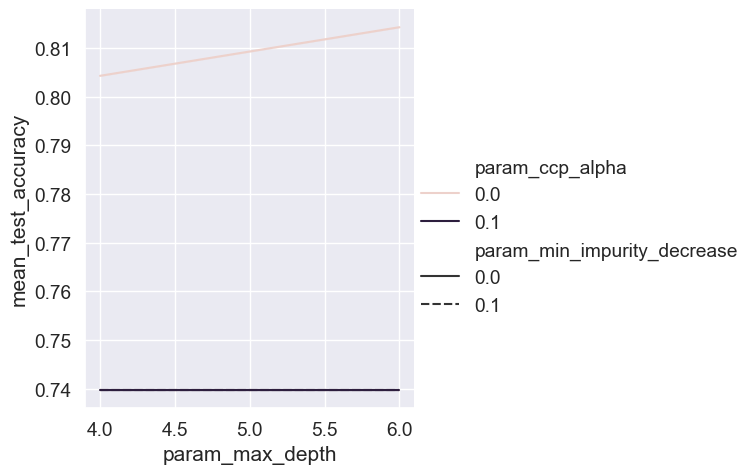

In [160]:
sns.relplot(x="param_max_depth", 
            y="mean_test_accuracy", 
            hue="param_ccp_alpha", # colores
            style="param_min_impurity_decrease",
            kind = "line", data=results)

### Predicción resultados

In [161]:
y_test = final_model.predict(X_test)

## Ensembling

### Random Forest

In [162]:
X=df.drop(columns="Target")
y=df["Target"]
print(X.shape)
print(y.shape)
X= procesamiento(X)
X.shape
print(X.shape)
X.head()

(76518, 37)
(76518,)
(76518, 32)


,Previous qualification (grade),Admission grade,Age at enrollment,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),...,Curricular units without evaluations,Course_33,Course_9119,Course_9500,Course_Others,Daytime/evening attendance_1,Debtor_1,Tuition fees up to date_1,Gender_1,Scholarship holder_1
0,126.0,122.6,18.0,0.0,6.0,6.0,6.0,14.500000,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
1,125.0,119.8,18.0,0.0,6.0,8.0,4.0,11.600000,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0
2,137.0,144.7,18.0,0.0,6.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
3,131.0,126.1,18.0,0.0,7.0,9.0,7.0,12.591250,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
4,132.0,120.1,18.0,0.0,7.0,12.0,6.0,12.933333,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0


In [163]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
params = {'criterion': ['gini'], 
          'max_depth': [5, 7], 
          'max_features': [0.3, 0.7], #sirve para no seleccionar todas las columnas
          'max_samples': [0.8, 0.5], #sirve para no seleccionar todas las filas
          'max_leaf_nodes': [10, 30], 
          'min_impurity_decrease': [0.01, 0.05], 
          'min_samples_split': [5, 10, 20], 
          'n_estimators': [50] }

In [164]:
scoring = ['accuracy']

# creamos la GridSeacrh
n_cv=3
grid_solver = GridSearchCV(estimator = model, # model to train
                           param_grid = params, # param_grid
                           scoring = scoring,
                           cv = n_cv,
                           refit = 'accuracy',
                           verbose = 3) # cuanto va a imprimir por pantalla

In [165]:
# entrenamos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

model_result = grid_solver.fit(X_train,y_train)

Train set: (61214, 32) (61214,)
Test set: (15304, 32) (15304,)
Fitting 3 folds for each of 96 candidates, totalling 288 fits
[CV 1/3] END criterion=gini, max_depth=5, max_features=0.3, max_leaf_nodes=10, max_samples=0.8, min_impurity_decrease=0.01, min_samples_split=5, n_estimators=50; accuracy: (test=0.787) total time=   0.9s
[CV 2/3] END criterion=gini, max_depth=5, max_features=0.3, max_leaf_nodes=10, max_samples=0.8, min_impurity_decrease=0.01, min_samples_split=5, n_estimators=50; accuracy: (test=0.806) total time=   0.9s
[CV 3/3] END criterion=gini, max_depth=5, max_features=0.3, max_leaf_nodes=10, max_samples=0.8, min_impurity_decrease=0.01, min_samples_split=5, n_estimators=50; accuracy: (test=0.802) total time=   0.9s
[CV 1/3] END criterion=gini, max_depth=5, max_features=0.3, max_leaf_nodes=10, max_samples=0.8, min_impurity_decrease=0.01, min_samples_split=10, n_estimators=50; accuracy: (test=0.789) total time=   0.9s
[CV 2/3] END criterion=gini, max_depth=5, max_features=0.3

In [166]:
results = model_result.cv_results_
results = pd.DataFrame(results)
results2 = results.T

In [167]:
model_result.best_estimator_

RandomForestClassifier(max_depth=7, max_features=0.7, max_leaf_nodes=10,
                       max_samples=0.5, min_impurity_decrease=0.01,
                       min_samples_split=5, n_estimators=50)

In [168]:
print("Train")
y_hat=model_result.predict(X_train)
print("Accuracy:", accuracy_score(y_train,y_hat))
# y_pred=model_result.predict(X_train)
# probs=model_result.predict_proba(X_train)
# print("Train AUC:", roc_auc_score(y_train,probs[:,1]))

print("Test")
y_hat=model_result.predict(X_test)
print("Accuracy:", accuracy_score(y_test,y_hat))
# y_pred=model_result.predict(X_test)
# probs=model_result.predict_proba(X_test)
# print("Train AUC:", roc_auc_score(y_test,probs[:,1]))

Train
Accuracy: 0.8029045643153527
Test
Accuracy: 0.8037767903815995


In [169]:
best_model = model_result.best_estimator_
best_model
final_model = best_model.fit(X,y) #hacemos el fit de los datos con el mejor modelo

In [170]:
final_model.feature_importances_
importances=pd.DataFrame([X.columns,final_model.feature_importances_], index=["feature","importance"]).T
print(importances.sort_values("importance", ascending = False).head(10))

                                 feature importance
12   Curricular units 2nd sem (approved)   0.603058
19             Curricular units approved   0.266512
6    Curricular units 1st sem (approved)   0.062402
13      Curricular units 2nd sem (grade)   0.044676
29             Tuition fees up to date_1   0.019539
7       Curricular units 1st sem (grade)    0.00318
21          Curricular units evaluations   0.000634
23                             Course_33        0.0
20             Curricular units credited        0.0
22  Curricular units without evaluations        0.0


#### Predecir Test

In [171]:
df_submission = pd.read_csv("test.csv")
X_submission = procesamiento(df_submission)
y_submission = final_model.predict(X_submission)

In [172]:
y_submission

array(['Dropout', 'Graduate', 'Graduate', ..., 'Dropout', 'Dropout',
       'Dropout'], dtype=object)

In [173]:
submission=pd.read_csv("sample_submission.csv")
submission.Target=y_submission
submission.to_csv("submission.csv", index=False)

### Boosting

#### ADABoosting

In [174]:
from sklearn.ensemble import AdaBoostClassifier

In [175]:
X = df.drop(columns=['Target'])
X = procesamiento(X)
y = df["Target"].copy()
# y.replace({"Dropout":0,"Enrolled":1,"Graduate":2}, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify=y)

In [176]:
clf = AdaBoostClassifier(algorithm="SAMME.R", n_estimators=100, learning_rate=0.3)
clf.fit(X_train, y_train)

c:\Users\Sergio\miniconda3\envs\python3_10_9\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


AdaBoostClassifier(learning_rate=0.3, n_estimators=100)

In [177]:
print("Train")
y_hat=clf.predict(X_train)
print("Accuracy:", accuracy_score(y_train,y_hat))
# y_pred=clf.predict(X_train)
# probs=clf.predict_proba(X_train)
# print("Train AUC:", roc_auc_score(y_train,probs[:,1]))

print("Test")
y_hat=clf.predict(X_test)
print("Accuracy:", accuracy_score(y_test,y_hat))
# y_pred=clf.predict(X_test)
# probs=clf.predict_proba(X_test)
# print("Train AUC:", roc_auc_score(y_test,probs[:,1]))

Train
Accuracy: 0.8164841866813812
Test
Accuracy: 0.8173026659696812


##### GridSearch

In [178]:
clf.get_params()
params = {'algorithm': ['SAMME.R'],
 'estimator': [None],
 'learning_rate': [0.2, 0.3, 0.5],
 'n_estimators': [100],
 'random_state': [None]}

In [179]:
scoring = ['accuracy']
grid_solver = GridSearchCV(estimator = clf, # model to train
                   param_grid = params,
                   scoring = scoring,
                   cv = 5,
                   n_jobs=-1,
                   refit='accuracy',
                   verbose = 2)

model_result_adaboost = grid_solver.fit(X_train,y_train) # generamos las combinaciones

Fitting 5 folds for each of 3 candidates, totalling 15 fits


c:\Users\Sergio\miniconda3\envs\python3_10_9\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


In [180]:
model_result_adaboost.best_estimator_

AdaBoostClassifier(learning_rate=0.5, n_estimators=100)

In [181]:
print("Train")
y_hat=model_result_adaboost.predict(X_train)
print("Accuracy:", accuracy_score(y_train,y_hat))
# y_pred=model_result.predict(X_train)
# probs=model_result.predict_proba(X_train)
# print("Train AUC:", roc_auc_score(y_train,probs[:,1]))

print("Test")
y_hat=model_result_adaboost.predict(X_test)
print("Accuracy:", accuracy_score(y_test,y_hat))
# y_pred=model_result.predict(X_test)
# probs=model_result.predict_proba(X_test)
# print("Train AUC:", roc_auc_score(y_test,probs[:,1]))

Train
Accuracy: 0.8178201144251155
Test
Accuracy: 0.821353894406691


In [182]:
best_model = model_result_adaboost.best_estimator_
best_model
final_model = best_model.fit(X,y) #hacemos el fit de los datos con el mejor modelo

c:\Users\Sergio\miniconda3\envs\python3_10_9\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


In [183]:
best_model.feature_importances_
importances=pd.DataFrame([X.columns,best_model.feature_importances_], index=["feature","importance"]).T
print(importances.sort_values("importance", ascending = False).head(15))

                                   feature importance
12     Curricular units 2nd sem (approved)       0.18
18               Curricular units enrolled       0.09
6      Curricular units 1st sem (approved)       0.08
19               Curricular units approved       0.07
13        Curricular units 2nd sem (grade)       0.07
1                          Admission grade       0.05
2                        Age at enrollment       0.05
21            Curricular units evaluations       0.05
10     Curricular units 2nd sem (enrolled)       0.04
11  Curricular units 2nd sem (evaluations)       0.03
0           Previous qualification (grade)       0.03
7         Curricular units 1st sem (grade)       0.03
5   Curricular units 1st sem (evaluations)       0.03
29               Tuition fees up to date_1       0.03
30                                Gender_1       0.03


In [184]:
final_model.feature_importances_
importances=pd.DataFrame([X.columns,final_model.feature_importances_], index=["feature","importance"]).T
print(importances.sort_values("importance", ascending = False).head(15))

                                   feature importance
12     Curricular units 2nd sem (approved)       0.18
18               Curricular units enrolled       0.09
6      Curricular units 1st sem (approved)       0.08
19               Curricular units approved       0.07
13        Curricular units 2nd sem (grade)       0.07
1                          Admission grade       0.05
2                        Age at enrollment       0.05
21            Curricular units evaluations       0.05
10     Curricular units 2nd sem (enrolled)       0.04
11  Curricular units 2nd sem (evaluations)       0.03
0           Previous qualification (grade)       0.03
7         Curricular units 1st sem (grade)       0.03
5   Curricular units 1st sem (evaluations)       0.03
29               Tuition fees up to date_1       0.03
30                                Gender_1       0.03


#### XGBoost

In [195]:
y = df["Target"].copy()
X = df.drop(columns=['Target'])
X = procesamiento(X)
y.replace({"Dropout":0,"Enrolled":1,"Graduate":2}, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify=y)

C:\Users\Sergio\AppData\Local\Temp\ipykernel_13484\4069770644.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  y.replace({"Dropout":0,"Enrolled":1,"Graduate":2}, inplace=True)


In [196]:
import xgboost as xgb
from xgboost import XGBClassifier

xgbmodel = XGBClassifier()
xgbmodel.get_params()

{'objective': 'binary:logistic',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'device': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'multi_strategy': None,
 'n_estimators': None,
 'n_jobs': None,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [197]:
params={'objective': ['multi:softmax'],
    'base_score': [0.5], # prediccion inicial
     'booster': ['gbtree'], # (gbtree, gblinear, dart)
     'colsample_bylevel': [1], # ratio de columnas en cada nivel
     'colsample_bytree': [0.7], # ratio de columnas por tree
     'gamma': [0.01],    # minimo "loss" reduccion para crear un nuevo split. Larger-> conservative
     'learning_rate': [0.1], # (eta) aportacion de cada arbol al modelo
     'max_depth': [3,5], # maxima profundidad en cada arbol
     'min_child_weight': [1], # minimo numero samples por hoja
    #'missing': [1], # si queremos reemplazar los missings por un numero
     'n_estimators': [100,150,200,300,500], # numero de arboles
     'n_jobs': [-1], # trabajos en paralelo
     'random_state': [0], # seed para generar los folds
     'reg_alpha': [0.1], # L1 regularitacion
     'reg_lambda': [0.01,0.1], # L2 regularitacion
     # 'scale_pos_weight': [1],
     'subsample': [0.8, 0.9]} # ratio de muestras por cada arbol

In [199]:
scoring = ['accuracy']
grid_solver = GridSearchCV(estimator = xgbmodel, # model to train
                   param_grid = params,
                   scoring = scoring,
                   cv = 5,
                   n_jobs=-1,
                   refit='accuracy',
                   verbose = 2)

model_result_xgboost = grid_solver.fit(X_train,y_train) # generamos las combinaciones

Fitting 5 folds for each of 40 candidates, totalling 200 fits


In [201]:
print("Train")
y_hat=model_result_xgboost.predict(X_train)
print("Accuracy:", accuracy_score(y_train,y_hat))
# y_pred=model_result.predict(X_train)
# probs=model_result.predict_proba(X_train)
# print("Train AUC:", roc_auc_score(y_train,probs[:,1]))

print("Test")
y_hat=model_result_xgboost.predict(X_test)
print("Accuracy:", accuracy_score(y_test,y_hat))
# y_pred=model_result.predict(X_test)
# probs=model_result.predict_proba(X_test)
# print("Train AUC:", roc_auc_score(y_test,probs[:,1]))

Train


Accuracy: 0.8461940580257311
Test
Accuracy: 0.8294563512807109


In [202]:
best_model = model_result_xgboost.best_estimator_
best_model
final_model = best_model.fit(X,y) #hacemos el fit de los datos con el mejor modelo

In [203]:
final_model.feature_importances_
importances=pd.DataFrame([X.columns,final_model.feature_importances_], index=["feature","importance"]).T
print(importances.sort_values("importance", ascending = False).head(15))

                                   feature importance
12     Curricular units 2nd sem (approved)   0.383936
19               Curricular units approved   0.140754
6      Curricular units 1st sem (approved)   0.079108
29               Tuition fees up to date_1   0.074372
31                    Scholarship holder_1   0.035941
21            Curricular units evaluations   0.035598
13        Curricular units 2nd sem (grade)   0.021184
28                                Debtor_1    0.02117
18               Curricular units enrolled    0.02097
11  Curricular units 2nd sem (evaluations)   0.020428
10     Curricular units 2nd sem (enrolled)   0.019261
4      Curricular units 1st sem (enrolled)   0.013146
30                                Gender_1   0.012256
5   Curricular units 1st sem (evaluations)   0.012048
26                           Course_Others   0.010845


##### Predecir Test

In [204]:
df_submission = pd.read_csv("test.csv")
X_submission = procesamiento(df_submission)
y_submission = final_model.predict(X_submission)
y_submission

array([0, 2, 2, ..., 0, 0, 0])

In [205]:
submission=pd.read_csv("sample_submission.csv")
submission.Target=y_submission

submission.Target.replace({0:"Dropout",1:"Enrolled",2:"Graduate"}, inplace=True)


C:\Users\Sergio\AppData\Local\Temp\ipykernel_13484\2829508418.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  submission.Target.replace({0:"Dropout",1:"Enrolled",2:"Graduate"}, inplace=True)


In [206]:
submission.to_csv("submission.csv", index=False)